# A. Interpretabilidad del modelo de Interrupción Legal del Embarazo

Suponemos que nuestro el objetivo del modelo es dar herramientas para cambiar la realidad, para esto es fundamental que el usuario final sea capaz de entender y confiar en el modelo, en vez de verlo como una caja negra indescifrable. Así, usaremos LIME como marco de referencia para agregar interpretabilidad al modelo seleccionado.

Recordemos que la etiqueta positiva (1) de nuestro modelo es si la mujer tiene **23 años o más**, mientras que la etiqueta negativa (0) es si la mujer es menor a 23 años.

A continuación seleccionamos 3 observaciones positivas y 3 observaciones negativas para hacer interpretabilidad.

In [1]:
import pandas as pd
import numpy as np
import lime
import lime.lime_tabular
import pickle
from IPython.display import Image

import load_data 

In [2]:
#################################### Cambiar rutas ######################################################

#PATH_TO_DATA = '~/Documents/Brenda/Proyecto/Data' 
PATH_TO_DATA = '/home/bj/Documents/IntroDataScience/Proyecto_parte2/Data'
#PATH_TO_DATA ='C:/Users/GZARAZUA/Desktop/MCD/MINERIA DE DATOS/Reporte aborto/Interpretabilidad/Proyecto/Data'

#path to images
PATH_TO_IMAGES =  '/home/bj/Documents/IntroDataScience/Proyecto_parte2/Images/'
#PATH_TO_IMAGES = "C:/Users/GZARAZUA/Desktop/MCD/MINERIA DE DATOS/Reporte aborto/Interpretabilidad/Proyecto/Aequitas Report/"

#path to model
PATH_TO_MODEL = '/home/bj/Documents/IntroDataScience/Proyecto_parte2/Model/'

#########################################################################################################

In [3]:
# Importamos la muestra de entrenamiento y la de prueba y el valor de prueba de la variable de salida
x_entrenamiento = load_data.load_df('x_entrenamiento.csv', PATH_TO_DATA, ',')
x_prueba = load_data.load_df('x_prueba.csv', PATH_TO_DATA, ',')
y_prueba = load_data.load_df('y_prueba.csv', PATH_TO_DATA, ',')

# Importamos el modelo
filename = PATH_TO_MODEL + 'final_model_ile.sav'
best_model =pickle.load(open(filename, 'rb'))

# Corremos el modelo para la base de prueba
y_predict = best_model.predict(x_prueba)
y_predict = pd.DataFrame(y_predict, columns=['score'])

In [4]:
# Lista de todas las variables
feat_vars = ['menarca', 'nhijos', 'ocupacion2_estudiante', 'npartos', 'escolaridad_superior', 'ocupacion2_empleada', 'ncesarea']

# Lista de las variables categoricas
cat_vars = ['ocupacion2_estudiante', 'escolaridad_superior', 'ocupacion2_empleada']

# Lista de etiuetas para las clases
class_names=['menor a 23','23 o mayor']

In [5]:
# Creamos el modelo de interpretabilidad LIME
explainer_xgb = lime.lime_tabular.LimeTabularExplainer(
    training_data=x_entrenamiento.values, #el set de entrenamiento con el que se entreno el modelo
    mode="classification",
    feature_names=feat_vars, #nombre de las variables, en el orden que se envian
    categorical_names = cat_vars,
    class_names=class_names,#el nombre de las etiquetas de clasificación
    kernel_width=0.75) #el tamaño de la ventana para generar datos (mientras más pequeño más cercano a los valores reales)

In [6]:
def muestra_lime(x_test, y_test, y_predict, model, num_feat, num_obs):
    """
    Esta funcion muestra el modelo de lime para la observacion num_obs, con la muestra de prueba x_test,
    la variable predicha y_predict, el modelo model y el numero de variables num_feat
    """
    if y_predict.values[num_obs]==0:
        print('El modelo predijo que la observación', num_obs, 'es una mujer de menos de 23 años, con las siguientes características \n originales:')
    else:
        print('El modelo predijo que la observación', num_obs, 'es una mujer de 23 años o más, con las siguientes características \n originales:')
    
    for col in x_test.columns:
        print('\t', col,': ', x_test[col].iloc[num_obs])
        
    print('El modelo de interpretabilidad de LIME es el siguiente:')
    
    exp = explainer_xgb.explain_instance(x_test.values[num_obs], model.predict_proba, num_features=num_feat)
    exp.show_in_notebook(show_table=True, show_all=False)
    
    if y_test.values[num_obs]==0:
        print('El valor verdadero de la predicción es: menor de 23 años')
    else:
        print('El valor verdadero de la predicción es: 23 años o más')

#### Ejemplo 1

In [7]:
NUM_FEAT = 5
#NUM_OBS = 250
muestra_lime(x_prueba, y_prueba, y_predict, best_model, NUM_FEAT , 250)

El modelo predijo que la observación 250 es una mujer de 23 años o más, con las siguientes características 
 originales:
	 menarca :  14.0
	 nhijos :  1.0
	 ocupacion2_estudiante :  0
	 npartos :  0.0
	 escolaridad_superior :  1
	 ocupacion2_empleada :  1
	 ncesarea :  0.0
El modelo de interpretabilidad de LIME es el siguiente:


El valor verdadero de la predicción es: 23 años o más


En el modelo de LIME indica que este registro tiene una probabilidad del 93% de tener 23 años o más. Las características que más peso aportaron a esta clasificación fueron: 
 - que cuenta con *escolaridad_superior*,
 - es empleada (*ocupación2_empleada=1*),
 - pero su ocupación no es estudiante, es decir, *ocupacion2_estudiante*=0
Por otro lado, que la observación no haya tenido ni partos ni cesáreas contribuye a una probabilidad de 7% de ser clasificada como menor a 23 años.

En este caso y dadas las características originales de la observación considerada, podemos decir que es correcto pensar que una mujer que ya no es estudiante, pero que tiene educación superior y es empleada es mayor a 23 años, a pesar de que no haya tenido partos o cesáreas. 

Cabe notar que a la variable relativa la número de hijos *nhijos* no fue uno de los atributos seleccionados por LIME para explicar la predicción. Esto puede deberse a que el número de hijos esta muy relacionado con el número de partos y cesáreas, sin embargo en este caso hay hijos sin haber tenido partos o cesáreas. Es decir, puede tratarse de un caso de adopción, suceso en el cual hay mucha probabilidad de que la mujer que adopta tenga más de 23 años.

#### Ejemplo 2

In [8]:
muestra_lime(x_prueba, y_prueba, y_predict, best_model, NUM_FEAT , 10) #15879

El modelo predijo que la observación 10 es una mujer de 23 años o más, con las siguientes características 
 originales:
	 menarca :  12.0
	 nhijos :  0.0
	 ocupacion2_estudiante :  0
	 npartos :  0.0
	 escolaridad_superior :  0
	 ocupacion2_empleada :  1
	 ncesarea :  0.0
El modelo de interpretabilidad de LIME es el siguiente:


El valor verdadero de la predicción es: 23 años o más


LIME indica que esta observación tiene la misma probabilidad de ser clasificada como mayor o menor a 23 años, sin embargo, nuestro modelo predijo que se trata de una mujer de 23 años o más. 

Que la mujer no fuera estudiante, fue el principal atributo para que se etiquetara a la mujer como mayor de 23 años. Por otro lado, la ausencia de escolaridad superior, hijos, partos y cesáreas fueron atributos que no contribuyeron a la predicción de ser mayor a 23 años, según las variables elegidad por LIME.

Aunque la predicción es acertada para esta observación, en realidad no se tiene una explicación satisfactoria de por qué el modelo la clasifico como mayor a 23 años. De hecho, la ambiguedad para asignar la etiqueta podría sugerir que estos casos -mujeres sin hijos, partos ni cesáreas que no son estudiantes ni cuentan con escolaridad superior pero que trabajan- son, en general, difíciles de clasificar. En particular, encontramos 2 casos con valores de atributos idénticos que fueron clasificados como mayores a 23 años, donde uno sí correspondía a la etiqueta pero el otro era menor a 23 años (observacion 15879).

#### Ejemplo 3

In [9]:
muestra_lime(x_prueba, y_prueba, y_predict, best_model, NUM_FEAT, 15884)

El modelo predijo que la observación 15884 es una mujer de 23 años o más, con las siguientes características 
 originales:
	 menarca :  12.0
	 nhijos :  1.0
	 ocupacion2_estudiante :  1
	 npartos :  1.0
	 escolaridad_superior :  1
	 ocupacion2_empleada :  0
	 ncesarea :  0.0
El modelo de interpretabilidad de LIME es el siguiente:


El valor verdadero de la predicción es: menor de 23 años


En este ejemplo, LIME considero que el atributo de mayor peso para clasificar a la observación como mayor de 23 años fue que se contaba con escolaridad superior, mientras que para la etiqueta contraria, el atributo de mayor peso fue que era estudiante, aunque que la mujer no tuviera cesáreas y no fuera empleada también aportaron medianamente.

Observamos que LIME incluye el número de cesáreas -cero-, pero excluye el número de partos y de hijos -uno, en ambos casos- para la clasificación. 

Dadas las características originales de esta observación, estudiante de educación superior, podemos ver que se trata de una mujer que esta cerca del threshold de los 23 años -ya sea menor o mayor. De hecho, LIME solo asigna un 17% más de probabilidad a que sea mayor de 23 años.

El valor verdadero de la predicción es que la mujer es menor de 23 años. En términos de la interpretabilidad, la predicción tiene sentido si tomamos en cuenta que, en general, cuando se termina la licenciatura se tienen 23 años.

LIME indica que la presencia de escolaridad superior pesa mucho para clasificar a la observación como una mujer de 23 años o más. Esto a pesar de que se trata de un estudiante. En este caso, la predicción fue errónea.

Nótese que entre las variables de mayor peso seleccionadas por LIME no se encuentra ni él número de hijos ni el número de partos, que en este caso es igual a 1. 

En los casos estudiados, para la etiqueta *mayor a 23 años*, LIME asigna un peso alto a las variables si se tiene escolaridad superior y si no se es estudiante. Por el contrario, para la etiqueta *menor a 23 años*, se tiene un peso mayor si la variable indica que se trata de un estudiante y no se tiene educación superior.

#### Ejemplo 4

In [10]:
muestra_lime(x_prueba, y_prueba, y_predict, best_model, NUM_FEAT, 9725)

El modelo predijo que la observación 9725 es una mujer de menos de 23 años, con las siguientes características 
 originales:
	 menarca :  13.0
	 nhijos :  0.0
	 ocupacion2_estudiante :  1
	 npartos :  0.0
	 escolaridad_superior :  0
	 ocupacion2_empleada :  0
	 ncesarea :  0.0
El modelo de interpretabilidad de LIME es el siguiente:


El valor verdadero de la predicción es: menor de 23 años


Para este caso, todas las variables contribuyen a clasificar a la observación como menor de 23 años. Es decir, una mujer que no ha tenido partos, ni hijos ni cesareas y que es estudiante pero no cuenta con escolaridad superior, tiene una probabilidad de 84% de tener menos de 23 años. Lo cual no contradice nuestra intuición.

#### Ejemplo 5

In [11]:
muestra_lime(x_prueba, y_prueba, y_predict, best_model, NUM_FEAT, 15886)

El modelo predijo que la observación 15886 es una mujer de 23 años o más, con las siguientes características 
 originales:
	 menarca :  12.0
	 nhijos :  0.0
	 ocupacion2_estudiante :  0
	 npartos :  0.0
	 escolaridad_superior :  0
	 ocupacion2_empleada :  1
	 ncesarea :  0.0
El modelo de interpretabilidad de LIME es el siguiente:


El valor verdadero de la predicción es: menor de 23 años


Notemos que este caso es parecido al ejemplo 2, una mujer que no es estudiante, no tiene escolaridad superior y que es empleada. Donde el modelo tiene casi la misma probabilidad para cada clase.

Nuevamente, que la mujer no sea estudiante es el factor de mayor peso para ser clasificada como mayor a 23 años. Sin embargo, el hecho de que no tenga escolaridad superior tiene un peso mayor para la etiqueta de menor a 23 años, aunque también las variables del número de hijos, partos y cesáreas agregan peso a esta etiqueta. 

Igual que en el ejemplo2, este es un caso difícil para el modelo y, de hecho, el valor de verdadero contradice el valor de la predicción. 

#### Ejemplo 6

In [12]:
muestra_lime(x_prueba, y_prueba, y_predict, best_model, NUM_FEAT, 12568)

El modelo predijo que la observación 12568 es una mujer de menos de 23 años, con las siguientes características 
 originales:
	 menarca :  11.0
	 nhijos :  1.0
	 ocupacion2_estudiante :  1
	 npartos :  1.0
	 escolaridad_superior :  0
	 ocupacion2_empleada :  0
	 ncesarea :  0.0
El modelo de interpretabilidad de LIME es el siguiente:


El valor verdadero de la predicción es: 23 años o más


En este caso, que la mujer no tenga escolaridad superior y sea estudiante son las variables que agregan mayor peso a la etiqueta de menor de 23 años, seguidas por las variables referentes al número de cesáreas y a que no es empleada.

Aunque el valor verdadero de la predicción sea que la mujer es mayor a 23 años, el modelo es acertado al etiquetar a la observación como menor de 23 años, pues podemos esperar que mujeres estudiantes que no cuenten con educación superior sean menores a 23 años. Sin embargo, solo se tiene 13% más de probabilidad de ser menor a 23 años, es decir, no estamos muy seguros de nuestra predicción. 

## Observaciones generales
 - En general, notamos que las variables que otorgan más peso a la etiqueta de *23 o más años* son las de escolaridad superior cuando es positiva y la de ocupación estudiante cuando es negativa. Mientras que para la etiqueta *menor a 23 años*, la etiqueta que tiene más peso es cuando se es estudiante.

 - Al parecer el modelo esta tomando escolaridad superior y ocupación estudiante como dos atributos totalmente excluyentes, sin embargo sabemos, que una persona puede ser estudiante de educación superior, como en el ejemplo 3. Esto podría deberse a la reclasificación que se hizo de la variable original *nivel educativo*, pues *escolaridad superior* incluye a todas aquellas que estan estudiando, han terminado o tienen inconclusa su educación superior.
 
 - Para los modelos de interpretabilidad considerados, se uso un kernel de 0.75. Se probaron los modelos para otros valores del kernel (0.40, 0.5, 0.9) encontrandose que las probabilidades de clase y las variables consideradas para la interpretación eran similares. 

- Notemos también que el modelo de interpretabilidad ayuda a tener una mejor comprensión para observaciones particulares, sin embargo esto no implica causalidad. Si bien es claro para nosotros, es importante ser cuidadoso en mencionarlo sobre todo a personas que no esten familiarizadas con la metodología.

- Cabe destacar también que modelo en sí no ofrece una explicación a nivel médico, pues ésta emplea mayor información del paciente y conocimientos especializados y hacer una recomendación personalizada de los anticonceptivos, respaldada en criterios médicos que son social y legalmente más aceptables.

# B. Auditoría de *Bias/Fairness*

## B1. Antecedentes del problema

Para los tomadores de decisiones de los hospitales registrados en esta red de intervenciones Legales de Embarazo, es importante predecir la edad de las mujeres pues se otorgaran métodos anticonceptivos acorde a su edad, pero solo para aquellas mujeres de 23 años o más. 

Respecto a los métodos existentes, es sabido que para cierto rango de edades hay algunos métodos más recomendados y/o usados, como los que a continuación se mencionan:

Para personas de menos de 23 años los métodos más comunes son:
+ Preservativo (previene embarazo y protege contra enfermedades de transmisión sexual)
+ Pastillas anticonceptivas (alta eficacia y pueden ayudar con otros aspectos de la salud)
+ Anillo anticonceptivo (bien usado es eficaz y más cómodo y ayduda a algunos aspectos de salud)
Expertos recomiendan el uso del doble método durante la adolescencia (hormonal con barrera)

**Para personas de 23 años o más, nuestra población objetivo, los métodos más usados son:**
+ DIU (método de larga duración apropiado para mujeres que no quieran tener hijos pronto; se requiere un ginecólogo para su colocación y muchos prefieren no utilizarlo en mujeres que no hayan tenido nunca hijos)
+ Diafragma (buena alternativa para las mujeres que no deseen un método anticonceptivo hormonal)
+ Parche anticonceptivo (método fiable y cómodo, pero muchas mujeres lo descartan porque puede ser visible)
+ Anticonceptivo inyectable (aplicable cada 3 meses)

En particular, en el rango de 25 a 29 años, aunque se utiliza también el condón, se tiende a usar más las píldoras. Por el contrario, entre los 20 y 24 años se tiende a usar más el condón que las píldoras.

Las mujeres entre 30 y 40 años que se plantean la maternidad, por lo general, desean decidir cuándo tener hijos, el número de hijos y el momento en el que ya no desean tener más hijos. Así, en este rango, los métodos más usados son:
+ Barrera
+ hormonales orales o tópicos
El DIU y los métodos anticonceptivos irreversibles (ligadura de trompas o vasectomía), son considerados para mujeres que no desean tener más hijos.

**Bajo estas recomendaciones, vemos que los métodos hormonales son sugeridos para nuestra población objetivo. Es importante señalar que éstos requieren prescripción médica, pues pueden provocar desajustes hormonales y con ello posibles peligros a la salud**.


## B2. Metrica *Bias/Fairness*

Considerando que existe una diferenciación relativamente importante en los métodos anticonceptivos acorde al rango de edad, que puede afectar gravemente la salud de aquellas pacientes que son mal clasificadas como d+e *23 años o más*, como tomadores de decisiones nos interesa **no equivocarnos** en la clasificación de las mujeres por su edad y así otorgar el método anticonceptivo adecuado evitando posibles riesgos a la salud. En particular, queremos minimizar los **falsos positivos** pues son los casos que podrían implicar posibles complicaciones de salud de las pacientes y conllevar impactos relevantes a los hospitales, tanto monetarios como legales y de reputación.

En términos de *bias y fairness* del modelo proponemos calcular y dar seguimiento al **False Discovery Rate Disparity** (FDR) que señala la proporción de mujeres que fueron clasificadas como de 23 o más cuando en realidad eran menores (*falsos positivos*) entre el total de mujeres clasificadas como de 23 años o más (*predichos positivos*), para cada grupo.  

Este indicador muestra si cada grupo (formado por los distintos valores que toman las variables que auditamos) tiene la misma proporción de falsos positivos de aquellos clasificados como positivos, con respecto a un grupo de referencia definido. 

Cabe notar que la intervención que estamos considerando es punitiva, pues aplicarla en mujeres incorrectamente clasificadas puede dañar su salud. Además, como se trata de una red de hospitales gubernamentales, se enfrentan restricciones presupuestales fuertes, lo que nos impide atender a todas las mujeres de la población objetivo. Por lo que se considera que del total solo se atenderá a un porcentaje relativamente pequeño.

## B3. Variables auditadas

Recordemos que nuestro modelo de predicción utiliza las siguientes variables: menarca,  *nhijos*, *ocupacion2_estudiante*, npartos, *escolaridad_superior*, *ocupacion2_empleada* y ncesarea.

Para analizar el bias/fairness del modelo, consideramos que las variables número de hijos (nhijos), si se es estudiante (ocupacion2_estudiante), si se tiene escolaridad superior (escolaridad_superior) y si su ocupación es empleada (ocupacion2_empleada) son las variables en las que la discriminación por grupo podría causar mayor inequidad en poblaciones vulnerables. 

Por ejemplo, si nuestras tasas de falsos positivos son más altas en poblaciones sin educación superior podríamos estar negando el tratamiento a personas sin educación superior que ya se encuentran en desventaja si las comparamos contra aquellas que si la tienen. Similarmente, para el caso de aquellas que son empleadas de las que no lo son y aquellas que son estudiantes de las que no lo son.

La siguiente imagen presenta la categoría de referencia para cada variable auditada, que fueron seleccionadas como aquellas que son más representativas.

In [13]:
 #Previamente se detectó que la aplicación web de Aequitas categoriza las variables numericas, y justo las variables binarias (0 o 1) las junta en una sola categoria
#por lo anterior se cambiaron los valores numericos de las variables binarias a variables de texto para que Aequitas se vea forzado a diferenciarlas
x_prueba_cambio_categorias=x_prueba
x_prueba_cambio_categorias.ocupacion2_estudiante = x_prueba_cambio_categorias.ocupacion2_estudiante.replace({0: "no_estudiante", 1: "estudiante"})
x_prueba_cambio_categorias.escolaridad_superior = x_prueba_cambio_categorias.escolaridad_superior.replace({0: "otro", 1: "escolaridad_superior"})
x_prueba_cambio_categorias.ocupacion2_empleada = x_prueba_cambio_categorias.ocupacion2_empleada.replace({0: "no_empleada", 1: "es_empleada"})
x_prueba_cambio_categorias.ncesarea = x_prueba_cambio_categorias.ncesarea.replace({0: "cero", 1: "uno", 2: "dos o mas", 3: "dos o mas", 4: "dos o mas"})
#x_prueba_cambio_categorias.head()

In [14]:
# Dataset para el análisis
data_bias = pd.concat([y_predict, y_prueba, x_prueba_cambio_categorias], axis=1)
#data_bias.to_csv("Data/data_bias_cambio_categoricas.csv", index=False)

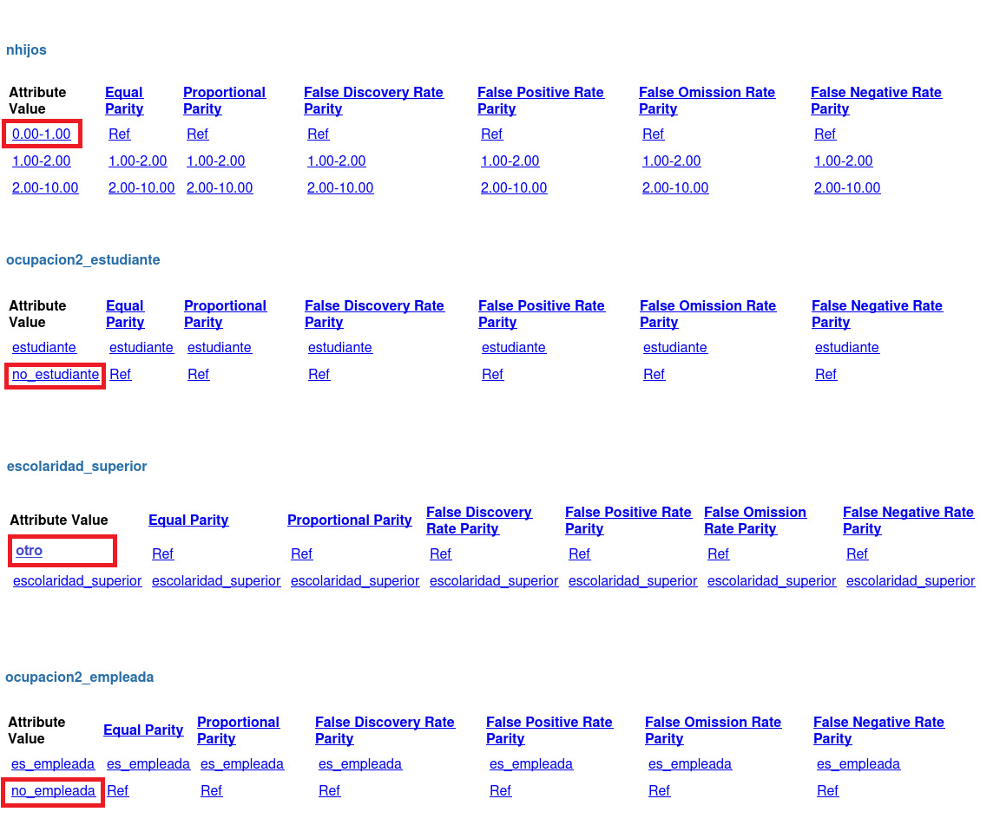

In [15]:
display(Image(filename = PATH_TO_IMAGES + "vars_auditadas.png", width="1000", unconfined=True))

## B4. Reporte Aequitas

Para las variables elegidas, usamos la plataforma de [Aequitas](http://aequitas.dssg.io/) para medir el *bias* y *fairness* del modelo. Considerando un threshold de 80% para fairness, esto es, para que nuestras métricas se consideren *"justas"* se equiere que esten entre 0.8 y 1.25.

### i) Métricas de grupos

Éstas se refieren al las métricas para cada variable, calculadas por grupo. Los resultados muestran que para todas las métricas y en particular para el **FDR**, el modelo tiene un sesgo hacia grupos específicos.

Para la variable del número de hijos, notamos que el FDR es de 0.26 para el grupo de referencia (de 0 a 1 hijo), mientras que para los grupos de mujeres con 1 a 2 hijos y con 2 o más, el FDR es mucho menor, de 0.11 y 0.4 respectivamente. Es decir, nuestro modelo esta sesgado a cometer más falsos positivos en el grupo de referencia que en los demás.

Similarmente, para la variable que indica si la mujer es estudiante, notamos que aunque el grupo de referencia -si son estudiantes- representa solo una tercera parte de la población, el FDR es de casi el doble que el del grupo complementario -no estudiantes-, de 0.5 contra 0.18.

En lo que se refiere a la variable de educación superior, la mayoría de las mujeres se encuentran en el grupo de referencia que tiene un FDR de 0.21. Este valor es significativamente mayor al 0.13 del grupo complementario, en términos del threshold establecido.

Finalmente, para la variable que indica que la mujer es empleada, se tiene que el FDR es relativamente similar para ambos grupos. Esto es, el modelo tiene tasas de falsos positivos parecidas, independientemente de si es o no empleada.

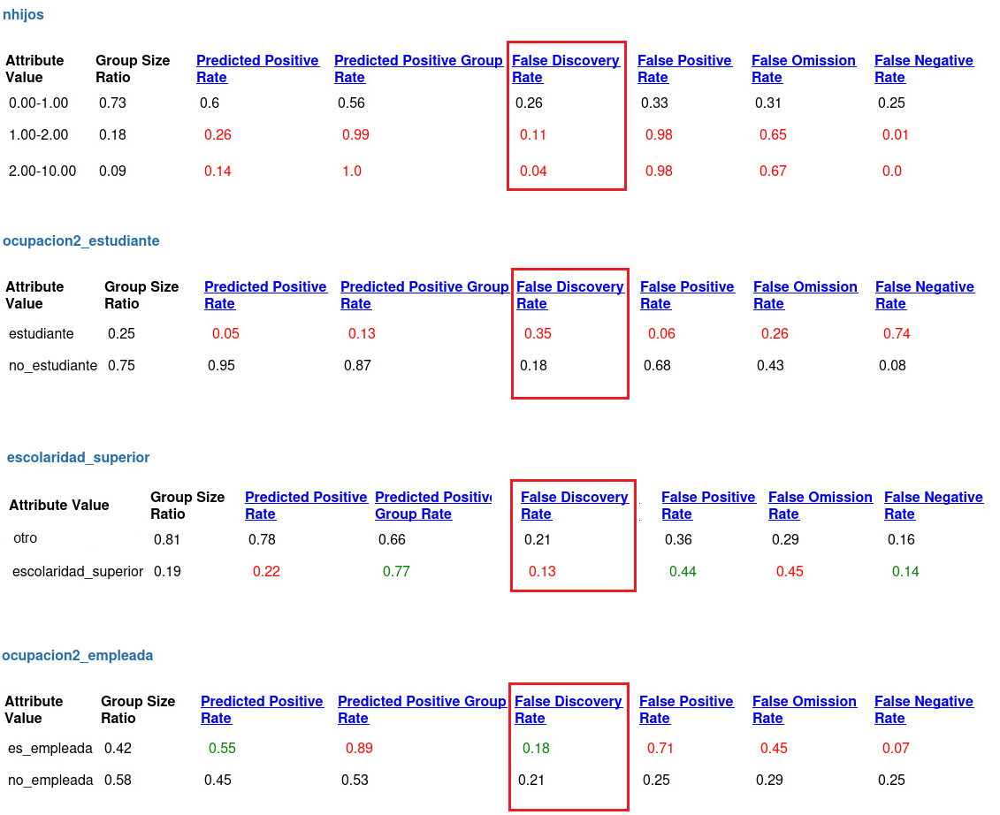

In [16]:
display(Image(filename = PATH_TO_IMAGES + "metricas_grupo.png", width="1000", unconfined=True))

### ii) Metricas de *bias*

Las de *bias* se calculan como los cocientes de las métricas de cada grupo entre el grupo de referencia.

Así, el FDR para el grupo de 1 a 2 hijos solo representa el 0.42 del grupo de referencia, que en este caso es el grupo de 0 a 1 hijo. Mientras que que el grupo de 2 a 10 hijos es solo el 0.15. Esto indica que el FDR es muy dispar entre los grupos.

Para el atributo de si se es estudiante, el FDR esta muy sesgdo para el grupo de estudiantes, pues es casi el doble comparado con el grupo de referencia.

En la variable de si se cuenta con escolaridad superior, la métrica considerada esta 40 puntos porcentuales por abajo que la métrica en el grupo base.

Nuevamente, observamos que las métricas entre grupos para la variable de si se es empleada, son relativamente parecidas y de hecho, se encuentran dentro del intervalo considerado como *justo*.

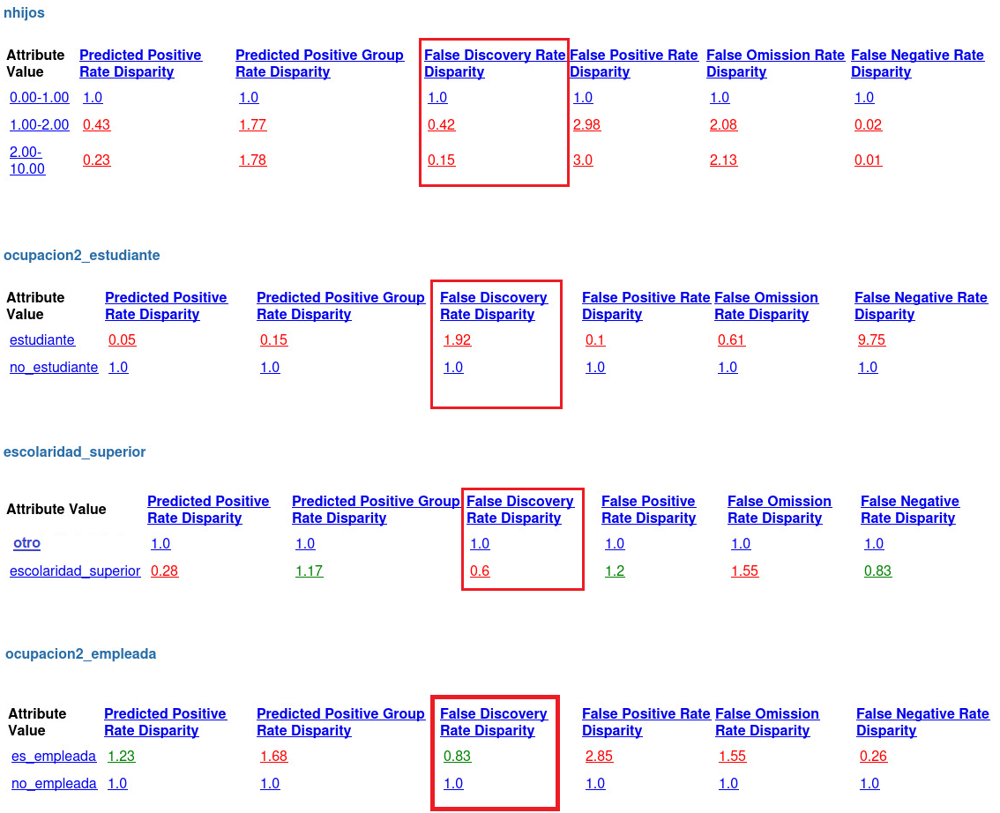

In [17]:
display(Image(filename = PATH_TO_IMAGES + "metricas_bias.png", width="1000", unconfined=True))

### iii) Análisis de *Fairness* 

El análisis muestra que el modelo falla en el FDR para 3 de las 4 variables consideradas. Por los que resulta que el  **modelo es *injusto***. 

Podemos ver en la siguiente imagen el resumen por variable, qué grupos y la medida -acorde al nivel de threshold especificado-.

Por ejemplo, para el número de hijos, podemos ver que el grupo de 1 a dos hijos tiene un FDR de 0.42 veces menor con respecto al grupo de referencia (0 a 1 hijo), mientras que el grupo de 2 o más es 0.15 veces mayor.

Como se había mencionado anteriormente, para el atributo de si se es estudiante, el grupo de estudiantes tiene un FDR 1.92 veces mayor que para el grupo base. 

Para la variable de escolaridad superior, se tiene que el grupo de escolaridad superior tienen un FDR que esta 40% por debajo del grupo de referencia.

Notemos que este resumen, solo present las variables para las cuales nuestro modelo es injusto, así que se omite la variable de si la mujer es empleada.

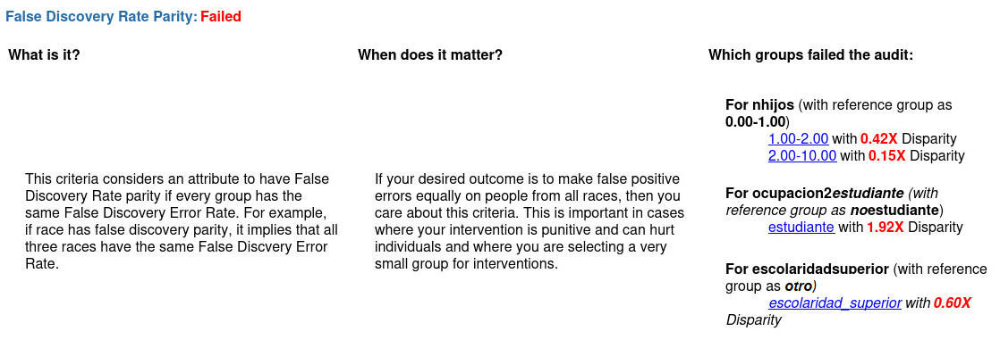

In [18]:
display(Image(filename = PATH_TO_IMAGES + "fairness_criteria.png", width="1000", unconfined=True))

Más aún, para las variables auditadas, nuestro modelo falla también en las métricas de Equal Parity, Proportional Parity, False Positive Rate y False Negative Rate.

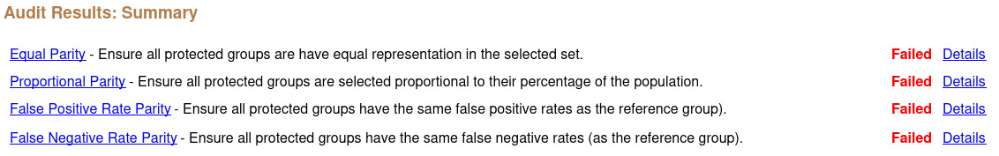

In [19]:
display(Image(filename = PATH_TO_IMAGES + "summary_fairness.png", width="1000", unconfined=True))

# Conclusiones 

- El modelo **no es imparcial**, pues el FDR es muy diferente para los grupos en 3 de las 4 variables auditadas.

- De hecho, para la variable que indica si la mujer es estudiante (*escolaridad2estudiante*), el FDR es de casi el doble que la del grupo de referencia. Así pues, en esta variable se presenta la mayor imparcialidad.

- En el apartado A planteamos la sospecha de que el modelo tiene dificultad para clasificar correctamente casos de mujeres sin hijos o con 1 hijo, que cuentan o no con escolaridad superior. Los resultados de bias/fairness arrojan más evidencia en ese sentido, pues tenemos las tasas más altas de falsos positivos en los grupos donde las mujeres tienen 0 o 1 hijo, son estudiantes y no cuentan con escolaridad superior.

+ Sin embargo, notemos que solo para el grupo de estudiantes, la tasa de falsos positivos (0.35) es mayor que la del modelo completo (0.26). Para todos los demás grupos, la tasa de falsos positivos es menor o igual. Es decir, nuestro modelo es **mejor de lo esperado** para todas las otras subpoblaciones.

- Como también notamos antes, el grupo —de  mujeres sin hijos o con 1 hijo, que cuentan o no con escolaridad superior y estudian o no— es el más cercano al threshold de edad a partir del cuál se dará la intervención y en el que, cómo tomadores de decisiones, tenemos el mayor riesgo de que una intervención mal aplicada tenga afectaciones mayores en la salud de las mujeres.

- Por lo tanto, recomendamos una revision al modelo original para ver si es posible alcanzar menores tasas de falsos positivos en esta subpoblación o, incluso hacer un modelo específico para este grupo.

- Es importante señalar que el uso de este modelo *injusto* puede generar discriminación en contra de mujeres con 0 o 1 hijos, que son estudiantes y que tienen más de 23 años pero por poco tiempo. Lo que puede tener implicaciones éticas como por ejemplo:
    + El hecho de que existan ciertos grupos con mayor tasa de falsos positivos podría ser señalado como falta de atención hacia ese grupo
    + Además, al no estar identificando correctamente a las mujeres mayores de 23 años, podríamos estar negando métodos anticonceptivos a mujeres que se encuentran en una etapa de su vida donde la intervención pudiera ser más útil, en términos de que puede darles más herramientas para decidir sobre su sexualidad. 
    + Por otro lado, podríamos estar incrementando el riesgo de afectar a un mayor número de mujeres menores de 23 años, pues es donde habría más casos con posibles complicaciones a la salud (por asignarles métodos no acorde a su edad)

- Finalmente, el hecho de que este modelo y la auditoría de *bias/fariness* se haya realizado sin contar con un equipo interdisciplinario, o por lo menos médico, como guía, puede reflejarse en la omisión de otras consideraciones importantes, de las que los autores no estan conscientes.

In [20]:
#Además, observemos que las proporciones de mujeres en la muestra de entrenamiento y en la de prueba, son similares para para los grupos, es decir, la proporción de mujeres con 0 o 1 hijos es de 70% y de 73%, respectivamente; para el grupo de estudiantes es del 28% y de 25%; y, para la ocupación empleada es del 46% y 42%. Excepto para las mujeres declararon tener educación superior, que es del 17% en la muestra de entrenamiento y de 81% en la de prueba.